Severity column added and dataset saved.
Augmented and balanced dataset saved.
Preprocessed dataset saved.
Final dataset saved and ready for modeling.
[LightGBM] [Info] Number of positive: 923, number of negative: 916
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 1839, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501903 -> initscore=0.007613
[LightGBM] [Info] Start training from score 0.007613
                 Model  Accuracy       AUC
0        Random Forest  0.954430  0.985336
1          Naive Bayes  0.822785  0.893145
2  Logistic Regression  0.827848  0.907322
3                  SVM  0.868354  0.946508
4             LightGBM  0.951899  0.989002
5                  MLP  0.921519  0.98149

<Figure size 1200x800 with 0 Axes>

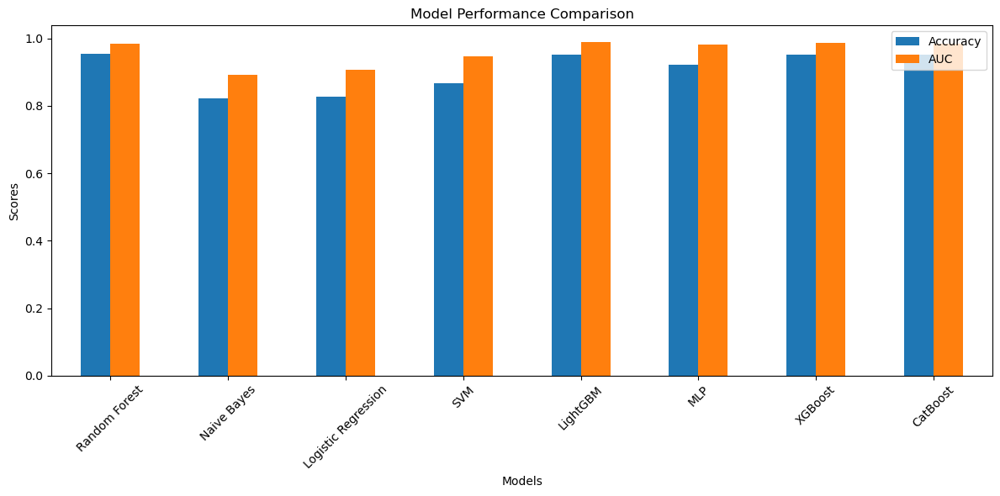

[LightGBM] [Info] Number of positive: 923, number of negative: 916
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 1839, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501903 -> initscore=0.007613
[LightGBM] [Info] Start training from score 0.007613

Voting Classifier - Disease Classification
[LightGBM] [Info] Number of positive: 923, number of negative: 916
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 1839, number of used f

<Figure size 1000x600 with 0 Axes>

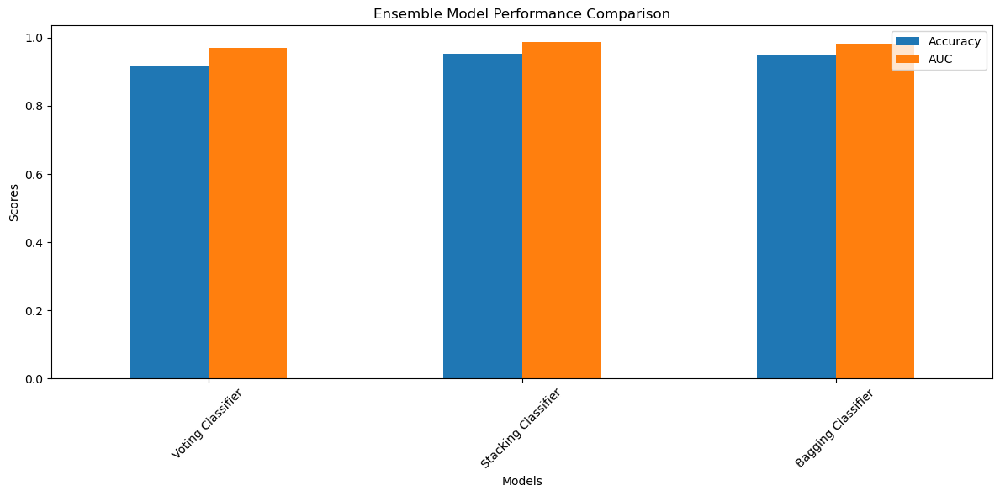

Federated Learning Global Model Accuracy: 0.8329113924050633


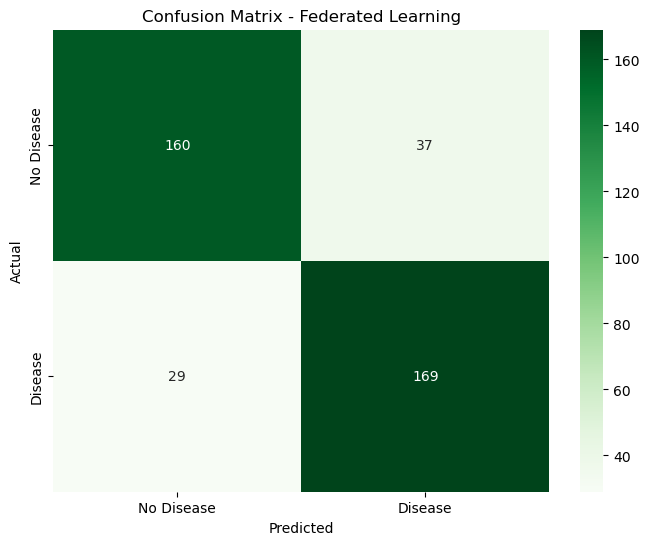

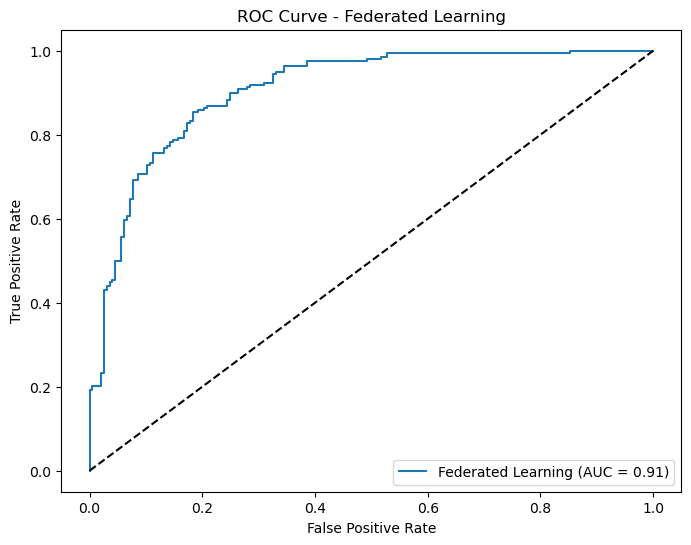

In [7]:
# Complete Project Code

# Task 1: Add a severity column
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from joblib import dump
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import (
    RandomForestClassifier, VotingClassifier, BaggingClassifier, StackingClassifier
)
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
)
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('cardio disease datasets.csv')

# Define severity calculation based on relevant columns (example logic)
def calculate_severity(row):
    severity_score = (
        0.3 * row['chol'] +  # Cholesterol weight
        0.2 * row['trestbps'] +  # Resting blood pressure weight
        0.2 * row['oldpeak'] +  # ST depression weight
        0.3 * (220 - row['thalach'])  # Max heart rate deviation weight
    )
    return severity_score

# Calculate severity and normalize it
scaler = MinMaxScaler()
data['severity_score'] = data.apply(calculate_severity, axis=1)

# Normalize the severity scores and assign severity categories
normalized_severity = scaler.fit_transform(data[['severity_score']]).ravel()
data['severity'] = pd.cut(
    normalized_severity,
    bins=[0, 0.25, 0.5, 0.75, 1.0],
    labels=['Low', 'Moderate', 'High', 'Critical']
)

# Save the updated dataset with the severity column
data.to_csv('cardio_disease_with_severity.csv', index=False)
print("Severity column added and dataset saved.")

data1 = pd.read_csv('cardio_disease_with_severity.csv')

# Task 2: Data augmentation and balancing with SMOTE

# Augment synthetic data
augmented_data = data1.copy()

# Add synthetic noise to certain numerical columns for augmentation
noise = pd.DataFrame(
    {
        col: (augmented_data[col] * 0.02 * np.random.randn(len(augmented_data))).astype(augmented_data[col].dtype)
        for col in ['age', 'trestbps', 'chol', 'thalach', 'oldpeak']
    }
)
augmented_data.update(noise, overwrite=True)

# Combine original and augmented data
combined_data = pd.concat([data1, augmented_data], ignore_index=True)

# Retain severity column while balancing using SMOTE
X = combined_data.drop(columns=['target', 'severity', 'severity_score'])  # Exclude severity and severity_score
y = combined_data['target']

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Add severity column back after resampling
severity_resampled = pd.concat(
    [combined_data['severity']] * 2, ignore_index=True
).iloc[:len(X_resampled)]

balanced_augmented_data = pd.concat([X_resampled, y_resampled, severity_resampled.reset_index(drop=True)], axis=1)
balanced_augmented_data.columns = list(X.columns) + ['target', 'severity']

# Save the balanced dataset
balanced_augmented_data.to_csv('balanced_augmented_data.csv', index=False)
print("Augmented and balanced dataset saved.")

# Task 3: Preprocessing the balanced dataset

# Load the balanced dataset
balanced_data = pd.read_csv('balanced_augmented_data.csv')

# Handle missing values
imputer = SimpleImputer(strategy='mean')
balanced_data.iloc[:, :-2] = imputer.fit_transform(balanced_data.iloc[:, :-2])  # All except target and severity

# Normalize numerical features
numerical_cols = ['age', 'trestbps', 'chol', 'thalach', 'oldpeak']
scaler = MinMaxScaler()
balanced_data[numerical_cols] = scaler.fit_transform(balanced_data[numerical_cols])

# Save the preprocessed dataset
balanced_data.to_csv('preprocessed_data.csv', index=False)
print("Preprocessed dataset saved.")

# Task 4: Ensure final dataset includes severity and target for modeling
final_data = balanced_data.copy()

# Save the final dataset as the main dataset
final_data.to_csv('final_dataset_with_severity.csv', index=False)
print("Final dataset saved and ready for modeling.")

# Model Training and Evaluation
# Separate features and targets
X = final_data.drop(columns=['target', 'severity'])
y_target = final_data['target']
y_severity = final_data['severity']

# Split the data into training, validation, and testing sets
X_train, X_temp, y_target_train, y_target_temp, y_severity_train, y_severity_temp = train_test_split(
    X, y_target, y_severity, test_size=0.3, random_state=42
)
X_val, X_test, y_target_val, y_target_test, y_severity_val, y_severity_test = train_test_split(
    X_temp, y_target_temp, y_severity_temp, test_size=0.5, random_state=42
)

# Define base models
models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "Naive Bayes": GaussianNB(),
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "MLP": MLPClassifier(random_state=42, max_iter=1000),
    "XGBoost": XGBClassifier(random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
}

# Comparative Analysis Table
results = []

for name, model in models.items():
    model.fit(X_train, y_target_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_target_test, y_pred)
    auc = roc_auc_score(y_target_test, model.predict_proba(X_test)[:, 1]) if hasattr(model, 'predict_proba') else None
    results.append({
        'Model': name,
        'Accuracy': accuracy,
        'AUC': auc
    })
    dump(model, f'{name.lower().replace(" ", "_")}_model.pkl')

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print(results_df)

# Plot Comparative Analysis
plt.figure(figsize=(12, 8))
results_df.set_index('Model').plot(kind='bar', figsize=(12, 6))
plt.title('Model Performance Comparison')
plt.ylabel('Scores')
plt.xlabel('Models')
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Save Comparative Analysis Table
results_df.to_csv('model_comparative_analysis.csv', index=False)

# Ensemble Models
voting_clf = VotingClassifier(
    estimators=[
        ('Random Forest', RandomForestClassifier(random_state=42)),
        ('Logistic Regression', LogisticRegression(max_iter=1000, random_state=42)),
        ('LightGBM', LGBMClassifier(random_state=42)),
        ('Naive Bayes', GaussianNB()),
        ('SVM', SVC(probability=True, random_state=42))
    ],
    voting='soft'
)
voting_clf.fit(X_train, y_target_train)
print("\nVoting Classifier - Disease Classification")
y_pred_voting = voting_clf.predict(X_test)
voting_accuracy = accuracy_score(y_target_test, y_pred_voting)
voting_auc = roc_auc_score(y_target_test, voting_clf.predict_proba(X_test)[:, 1])

stacking_clf = StackingClassifier(
    estimators=[
        ('Random Forest', RandomForestClassifier(random_state=42)),
        ('Logistic Regression', LogisticRegression(max_iter=1000, random_state=42)),
        ('LightGBM', LGBMClassifier(random_state=42)),
        ('SVM', SVC(probability=True, random_state=42))
    ],
    final_estimator=LogisticRegression()
)
stacking_clf.fit(X_train, y_target_train)

print("\nStacking Classifier - Disease Classification")
y_pred_stacking = stacking_clf.predict(X_test)
stacking_accuracy = accuracy_score(y_target_test, y_pred_stacking)
stacking_auc = roc_auc_score(y_target_test, stacking_clf.predict_proba(X_test)[:, 1])

bagging_clf = BaggingClassifier(
    estimator=RandomForestClassifier(random_state=42), n_estimators=10, random_state=42
)
bagging_clf.fit(X_train, y_target_train)
print("\nBagging Classifier - Disease Classification")
y_pred_bagging = bagging_clf.predict(X_test)
bagging_accuracy = accuracy_score(y_target_test, y_pred_bagging)
bagging_auc = roc_auc_score(y_target_test, bagging_clf.predict_proba(X_test)[:, 1])

ensemble_results = pd.DataFrame({
    'Model': ['Voting Classifier', 'Stacking Classifier', 'Bagging Classifier'],
    'Accuracy': [voting_accuracy, stacking_accuracy, bagging_accuracy],
    'AUC': [voting_auc, stacking_auc, bagging_auc]
})

# Save Ensemble Models
dump(voting_clf, 'voting_classifier.pkl')
dump(stacking_clf, 'stacking_classifier.pkl')
dump(bagging_clf, 'bagging_classifier.pkl')

print("\nEnsemble Model Results:")
print(ensemble_results)

# Plot Comparative Analysis of Ensembles
plt.figure(figsize=(10, 6))
ensemble_results.set_index('Model').plot(kind='bar', figsize=(12, 6))
plt.title('Ensemble Model Performance Comparison')
plt.ylabel('Scores')
plt.xlabel('Models')
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Task 5: Federated Learning Implementation
# Simulate federated learning by partitioning data into nodes
num_nodes = 3
nodes = []
X_shuffled, y_shuffled = shuffle(X_train, y_target_train, random_state=42)
node_size = len(X_shuffled) // num_nodes

for i in range(num_nodes):
    start_idx = i * node_size
    end_idx = (i + 1) * node_size if i < num_nodes - 1 else len(X_shuffled)
    nodes.append((X_shuffled[start_idx:end_idx], y_shuffled[start_idx:end_idx]))

# Define a global model
global_model = LogisticRegression(max_iter=1000, random_state=42)
global_model.fit(X_train, y_target_train)  # Initialize global model to avoid missing attributes

# Function to train a model on a single node
def train_node_model(X, y):
    local_model = LogisticRegression(max_iter=1000, random_state=42)
    local_model.fit(X, y)
    return local_model.coef_, local_model.intercept_

# Perform federated learning (e.g., FedAvg for simplicity)
global_coef = np.zeros_like(global_model.coef_)
global_intercept = np.zeros_like(global_model.intercept_)
total_samples = 0

for X_node, y_node in nodes:
    coef, intercept = train_node_model(X_node, y_node)
    n_samples = len(X_node)
    global_coef += coef * n_samples
    global_intercept += intercept * n_samples
    total_samples += n_samples

# Average the model weights
global_coef /= total_samples
global_intercept /= total_samples

# Update the global model with aggregated weights
global_model.coef_ = global_coef
global_model.intercept_ = global_intercept

# Evaluate the global model on the test set
y_pred = global_model.predict(X_test)
accuracy = accuracy_score(y_target_test, y_pred)
print(f"Federated Learning Global Model Accuracy: {accuracy}")

# Confusion Matrix for Federated Learning
conf_matrix = confusion_matrix(y_target_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=['No Disease', 'Disease'], yticklabels=['No Disease', 'Disease'])
plt.title('Confusion Matrix - Federated Learning')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# ROC Curve for Federated Learning
fpr, tpr, _ = roc_curve(y_target_test, global_model.predict_proba(X_test)[:, 1])
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Federated Learning (AUC = {roc_auc_score(y_target_test, global_model.predict_proba(X_test)[:, 1]):.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve - Federated Learning')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Processing Random Forest...


 94%|=================== | 739/790 [00:13<00:00]       

SHAP Summary plot for Random Forest


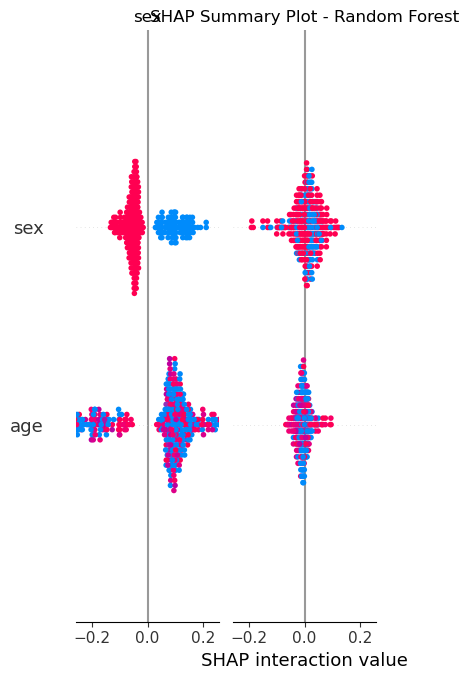

LIME Explanation for Random Forest (Sample index 21):


c:\Users\vashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Processing Naive Bayes...
Error with SHAP for Naive Bayes: The passed model is not callable and cannot be analyzed directly with the given masker! Model: GaussianNB()
Switching to KernelExplainer...


  0%|          | 0/395 [00:00<?, ?it/s]

SHAP Summary plot for Naive Bayes


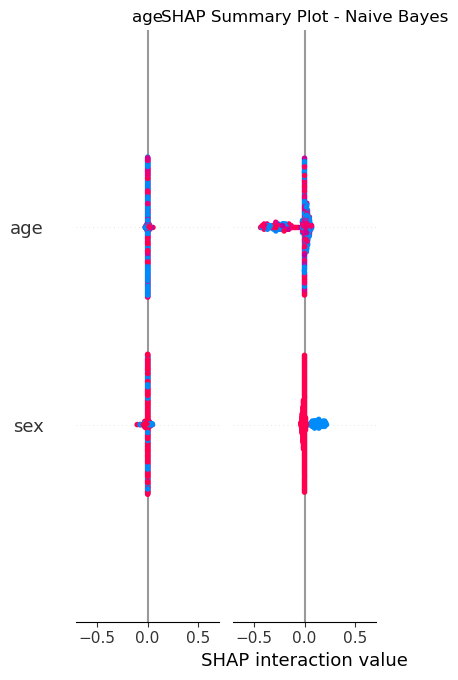

LIME Explanation for Naive Bayes (Sample index 246):


c:\Users\vashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


Processing Logistic Regression...
Error with SHAP for Logistic Regression: LinearExplainer.explain_row() got an unexpected keyword argument 'check_additivity'
Switching to KernelExplainer...


  0%|          | 0/395 [00:00<?, ?it/s]

SHAP Summary plot for Logistic Regression


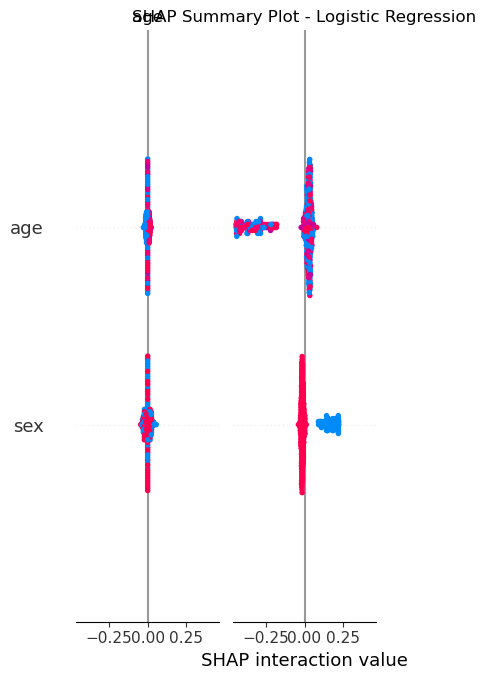

LIME Explanation for Logistic Regression (Sample index 317):


c:\Users\vashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Processing SVM...
Error with SHAP for SVM: The passed model is not callable and cannot be analyzed directly with the given masker! Model: SVC(probability=True, random_state=42)
Switching to KernelExplainer...


  0%|          | 0/395 [00:00<?, ?it/s]

SHAP Summary plot for SVM


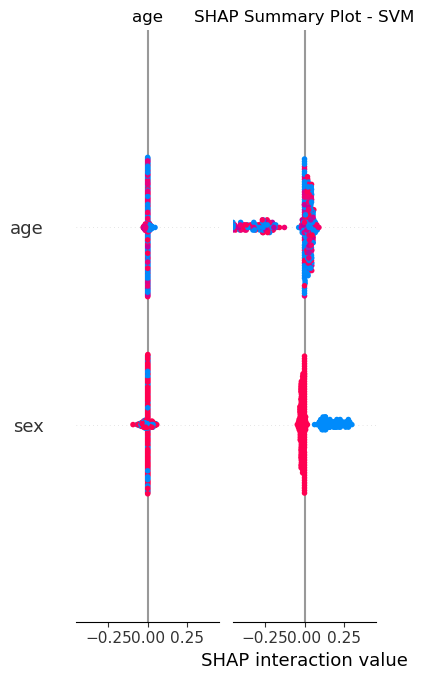

c:\Users\vashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


LIME Explanation for SVM (Sample index 303):


Processing LightGBM...
SHAP Summary plot for LightGBM


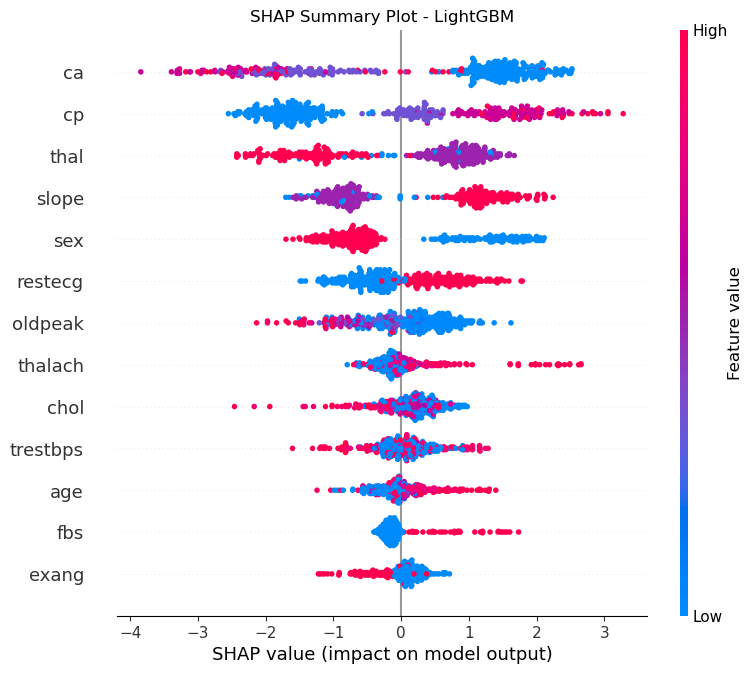

LIME Explanation for LightGBM (Sample index 331):


Processing MLP...
Error with SHAP for MLP: The passed model is not callable and cannot be analyzed directly with the given masker! Model: MLPClassifier(max_iter=1000, random_state=42)
Switching to KernelExplainer...


  0%|          | 0/395 [00:00<?, ?it/s]

SHAP Summary plot for MLP


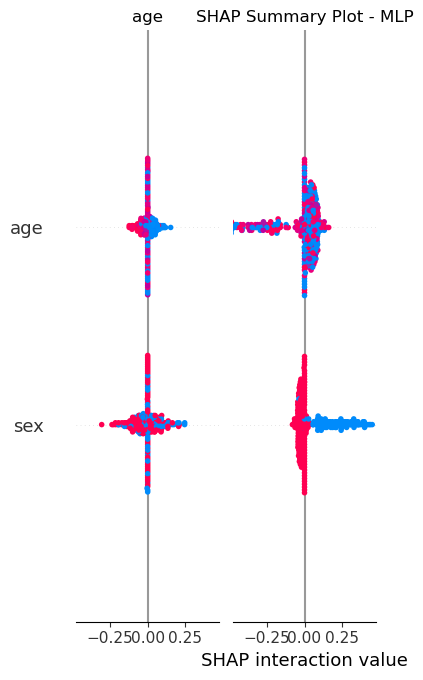

LIME Explanation for MLP (Sample index 363):


c:\Users\vashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Processing XGBoost...
SHAP Summary plot for XGBoost


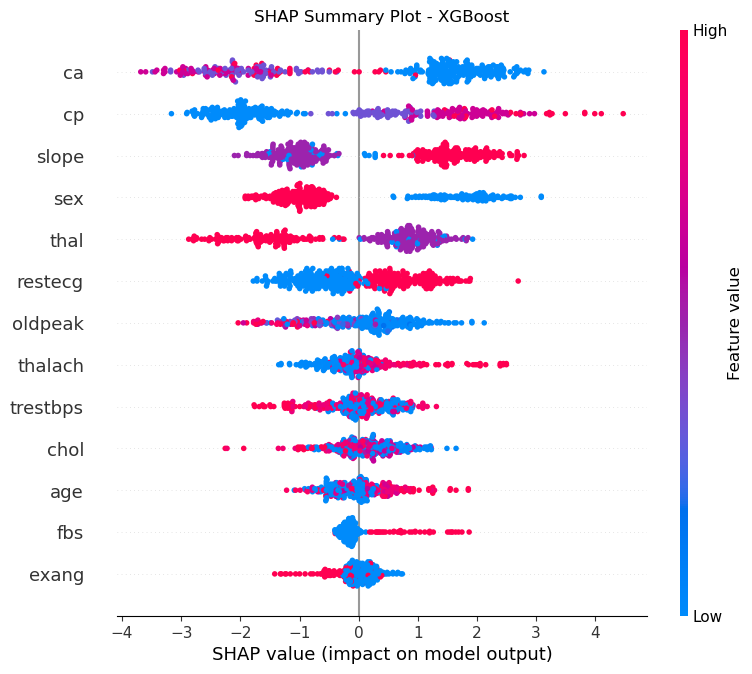

LIME Explanation for XGBoost (Sample index 119):


Processing CatBoost...


 99%|===================| 392/395 [00:25<00:00]        

SHAP Summary plot for CatBoost


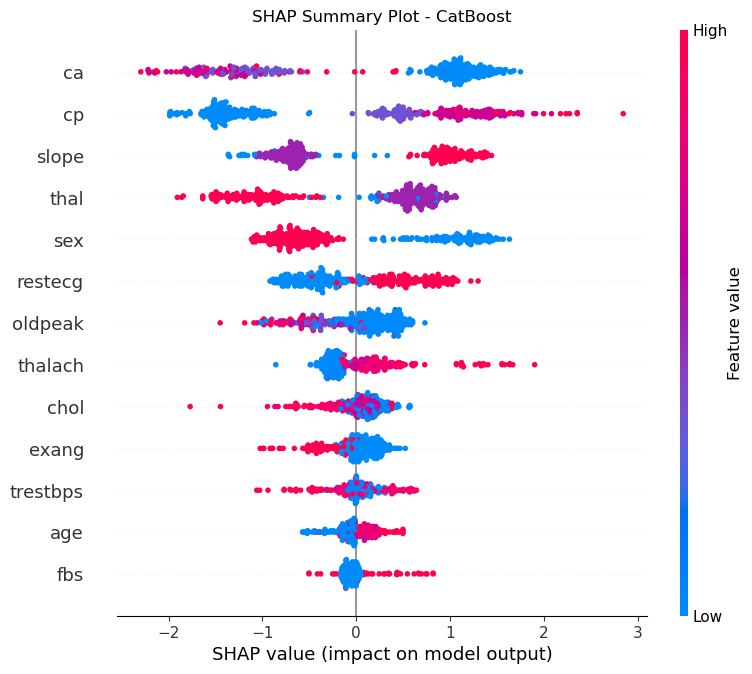

LIME Explanation for CatBoost (Sample index 213):


In [15]:
from lime.lime_tabular import LimeTabularExplainer
import shap
import matplotlib.pyplot as plt

# Loop through all models and generate explanations
lime_results = {}
shap_results = {}

for name, model in models.items():
    print(f"Processing {name}...")
    
    # SHAP Explanation
    try:
        # Use SHAP's Explainer if the model is supported
        explainer = shap.Explainer(model, X_train)
        shap_values = explainer(X_test, check_additivity=False)
    except Exception as e:
        print(f"Error with SHAP for {name}: {e}")
        print("Switching to KernelExplainer...")
        explainer = shap.KernelExplainer(model.predict_proba, shap.kmeans(X_train, 10))
        shap_values = explainer.shap_values(X_test, nsamples=100)
    
    shap_results[name] = shap_values

    # Visualize SHAP
    print(f"SHAP Summary plot for {name}")
    shap.summary_plot(shap_values, X_test, feature_names=X_test.columns, show=False)
    plt.title(f'SHAP Summary Plot - {name}')
    plt.show()

    # LIME Explanation
    try:
        # Create a LimeTabularExplainer
        lime_explainer = LimeTabularExplainer(
            training_data=X_train.values,
            feature_names=X_train.columns.tolist(),
            class_names=model.classes_ if hasattr(model, "classes_") else ["Class 0", "Class 1"],
            mode="classification" if hasattr(model, "predict_proba") else "regression"
        )
        
        # Explain a single prediction (randomly select an instance)
        idx = np.random.randint(0, len(X_test))
        exp = lime_explainer.explain_instance(
            data_row=X_test.iloc[idx].values,
            predict_fn=model.predict_proba if hasattr(model, "predict_proba") else model.predict
        )
        
        # Save LIME results
        lime_results[name] = exp

        # Visualize LIME explanation
        print(f"LIME Explanation for {name} (Sample index {idx}):")
        exp.show_in_notebook(show_table=True)
    except Exception as e:
        print(f"Error with LIME for {name}: {e}")
